In [1]:
# importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error

import datetime

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# reading csv file while adding keep_default_na=False as few of the columns have NA as its value and pandas may confuse for null value
df = pd.read_csv('./train.csv',keep_default_na=False)
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NA,0,2,2008,WD,Normal,208500
1,2,20,RL,80,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NA,0,5,2007,WD,Normal,181500
2,3,60,RL,68,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NA,0,9,2008,WD,Normal,223500
3,4,70,RL,60,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NA,0,12,2008,WD,Normal,250000


In [3]:
# checking the dimensions
df.shape

(1460, 81)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Id             1460 non-null   int64 
 1   MSSubClass     1460 non-null   int64 
 2   MSZoning       1460 non-null   object
 3   LotFrontage    1460 non-null   object
 4   LotArea        1460 non-null   int64 
 5   Street         1460 non-null   object
 6   Alley          1460 non-null   object
 7   LotShape       1460 non-null   object
 8   LandContour    1460 non-null   object
 9   Utilities      1460 non-null   object
 10  LotConfig      1460 non-null   object
 11  LandSlope      1460 non-null   object
 12  Neighborhood   1460 non-null   object
 13  Condition1     1460 non-null   object
 14  Condition2     1460 non-null   object
 15  BldgType       1460 non-null   object
 16  HouseStyle     1460 non-null   object
 17  OverallQual    1460 non-null   int64 
 18  OverallCond    1460 non-null

### Converting values to appropriate data types

In [5]:
df[['MSSubClass', 'OverallQual', 'OverallCond']] = df[['MSSubClass', 'OverallQual', 'OverallCond']].astype('object')
df['LotFrontage'] = pd.to_numeric(df['LotFrontage'], errors='coerce')
df['MasVnrArea'] = pd.to_numeric(df['MasVnrArea'], errors='coerce')

In [6]:
df.describe()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,70.049958,10516.828082,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,24.284752,9981.264932,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,21.000000,1300.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,59.000000,7553.500000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,69.000000,9478.500000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,80.000000,11601.500000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,313.000000,215245.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [7]:
df.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
Alley              0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [8]:
# Replacing missing values
df['LotFrontage'].fillna(df['LotFrontage'].median(), inplace=True);
df['MasVnrArea'].fillna(df['MasVnrArea'].median(), inplace=True)


In [9]:
df.isnull().sum()
#df['MasVnrArea'].isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [10]:
# 'Id' column cannot be use for analysis so dropping it
df.drop('Id', axis = 1, inplace = True)
print(df.shape)

(1460, 80)


### Univariate and Bivariate Analysis

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

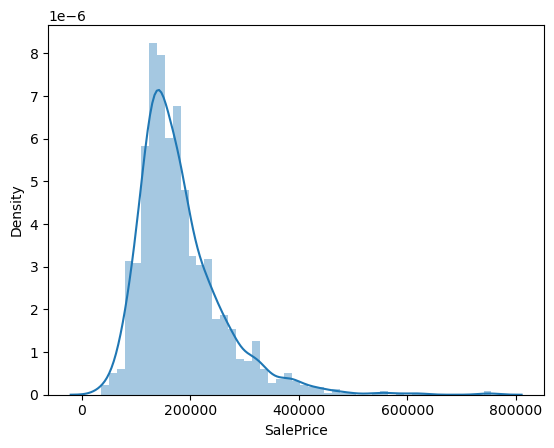

In [11]:
# Analysing target variable
sns.distplot(df['SalePrice'])

In [12]:
sns.pairplot(df)

In [13]:
# Getting the age of the houses
df['CurrentYear'] = datetime.datetime.now().year
df["Age"] = df['CurrentYear'] - df['YearBuilt']
df.drop(['CurrentYear', 'YearBuilt'], axis = 1, inplace = True)

In [14]:
# Dividing dataframes into categorical and numerical columns

df_numerical = df.select_dtypes(include=['int64', 'float64'])
df_categorical = df.select_dtypes(include='object')

### Checking for outliers in numerical columns

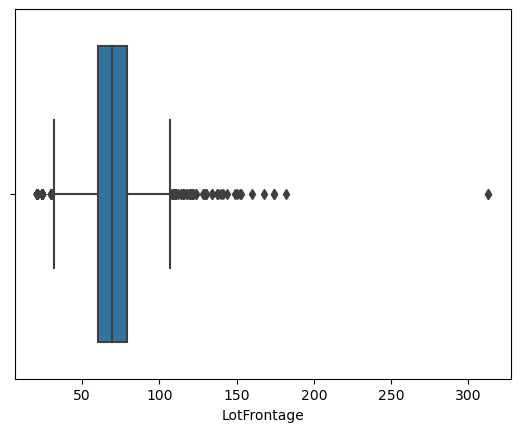

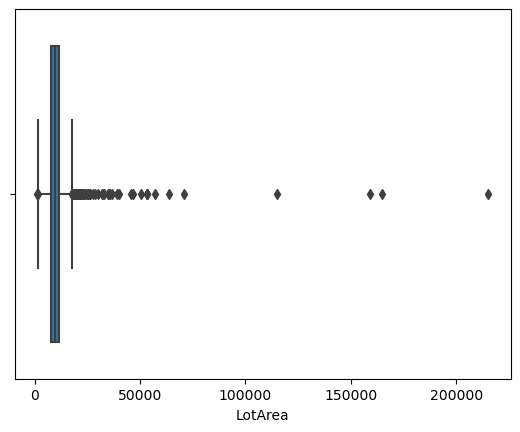

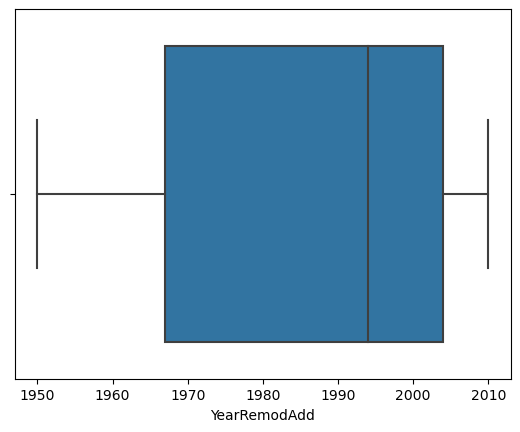

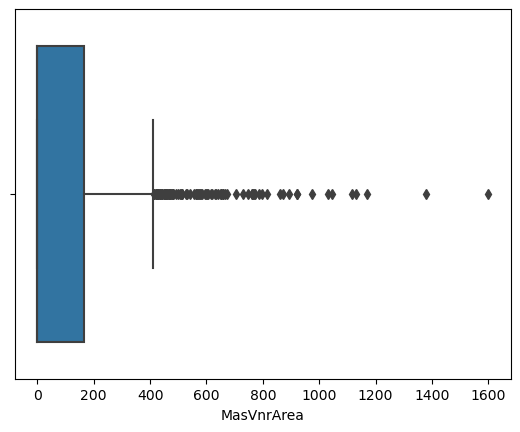

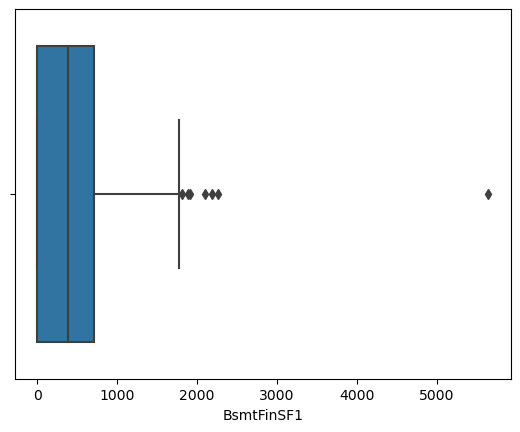

...

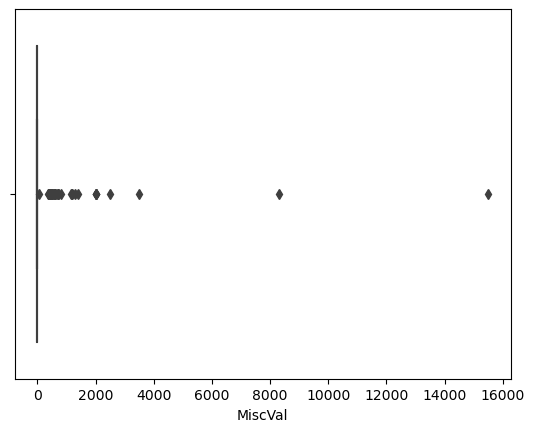

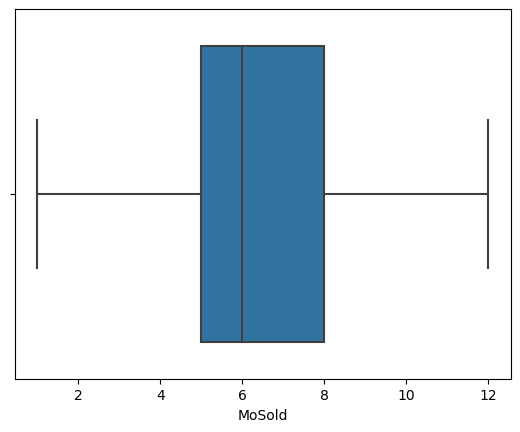

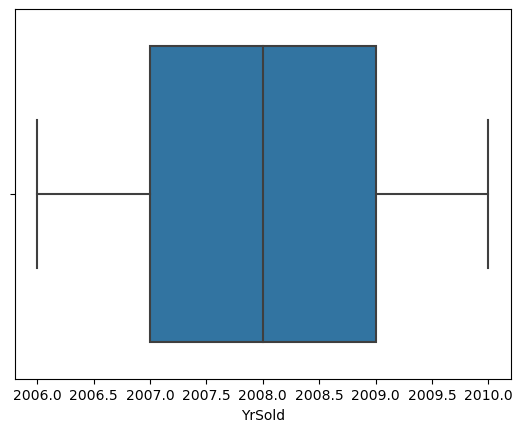

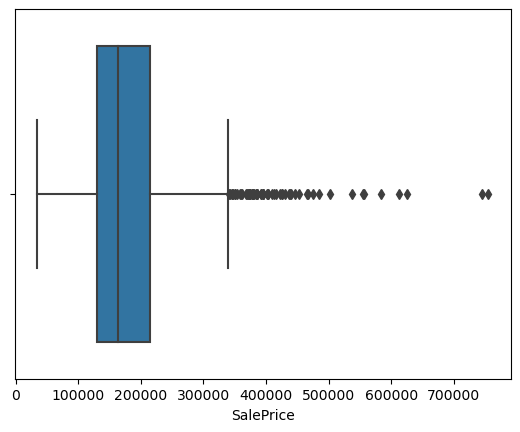

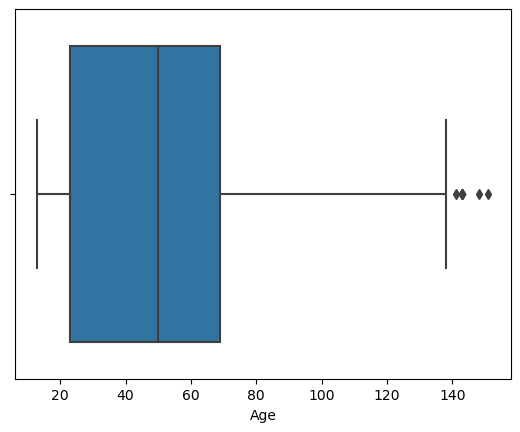

In [15]:
for col in df_numerical.columns:
    sns.boxplot(df_numerical[col])
    plt.show()    

In [16]:
# Most of the numerical columns have outliers, so to treat them seting lower bound to 5% and upper bound to 95%


for col in df_numerical.columns:
    df_numerical[col][df_numerical[col] <= df_numerical[col].quantile(0.05)] = df_numerical[col].quantile(0.05)
    df_numerical[col][df_numerical[col] >= df_numerical[col].quantile(0.95)] = df_numerical[col].quantile(0.95)

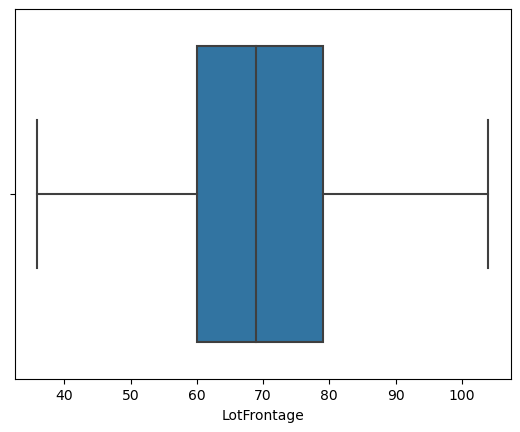

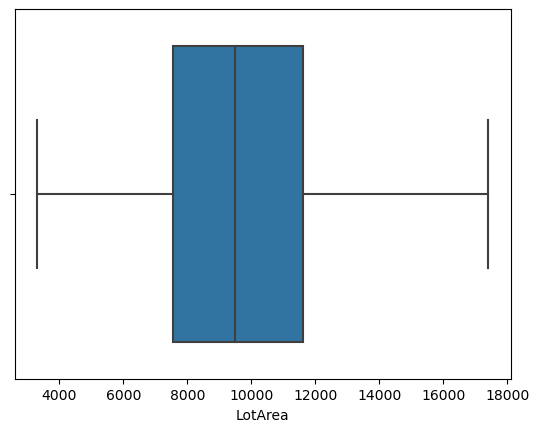

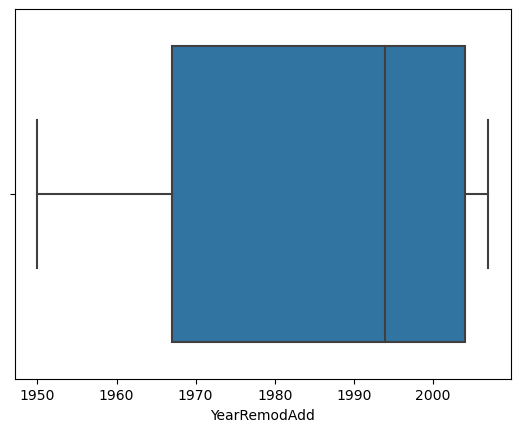

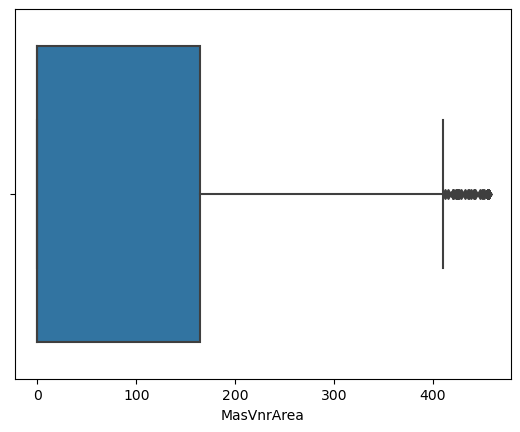

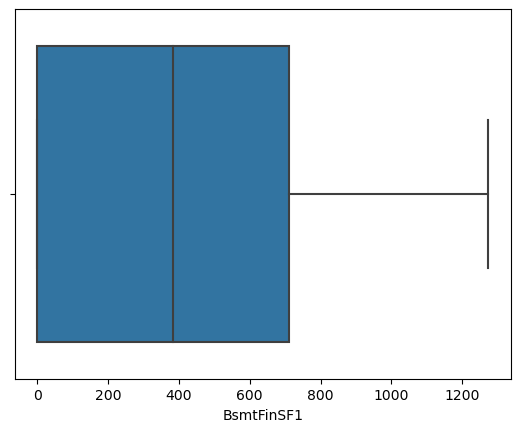

...

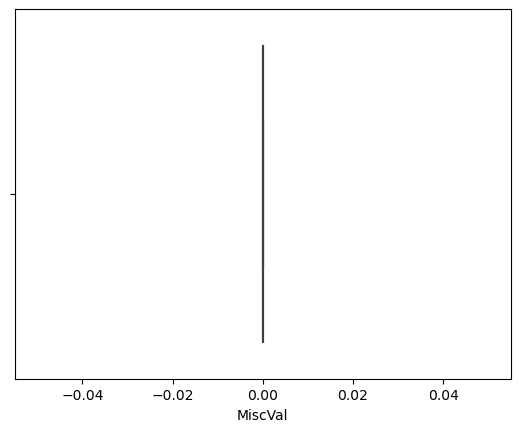

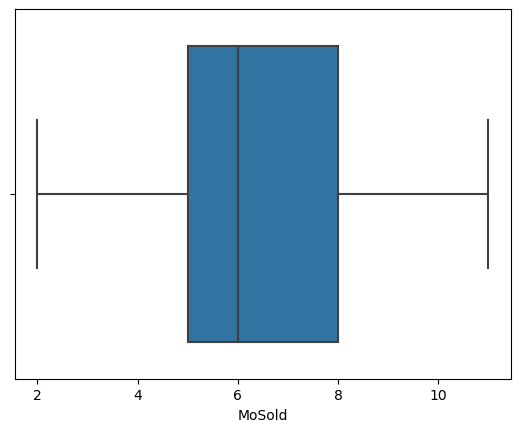

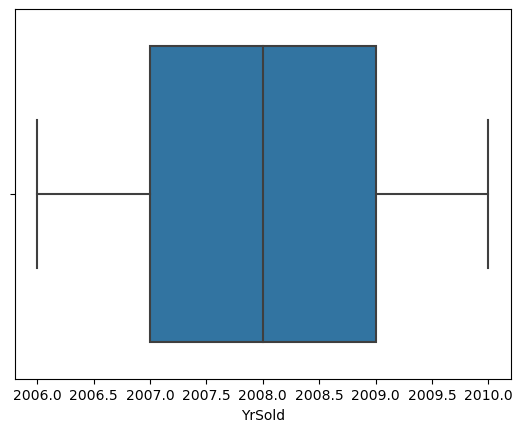

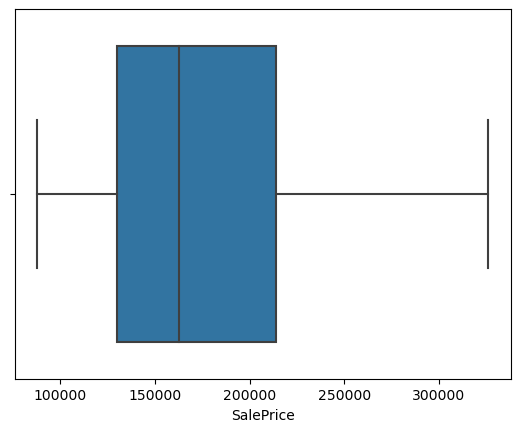

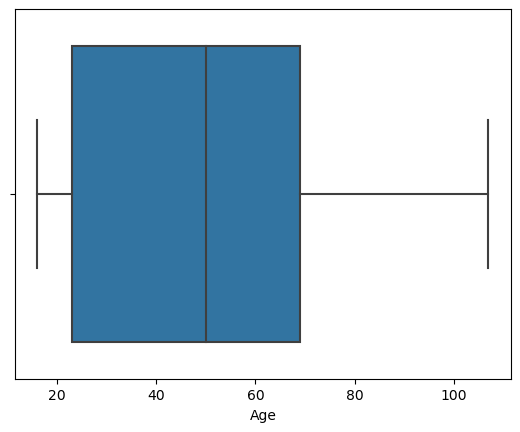

In [17]:
# Checking for outliers after the treatment
for col in df_numerical.columns:
    sns.boxplot(df_numerical[col])
    plt.show()   

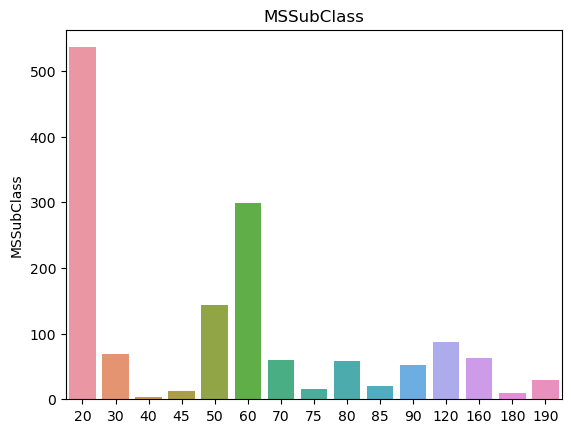

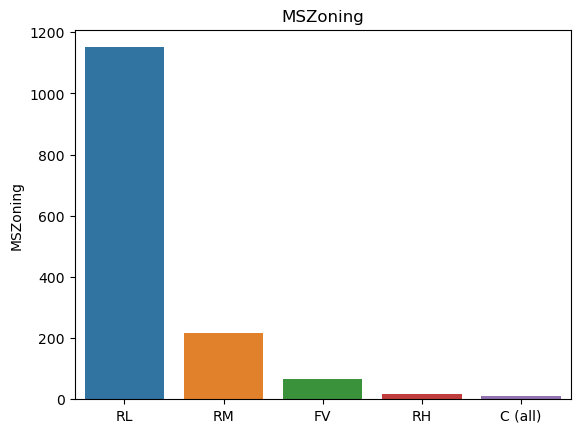

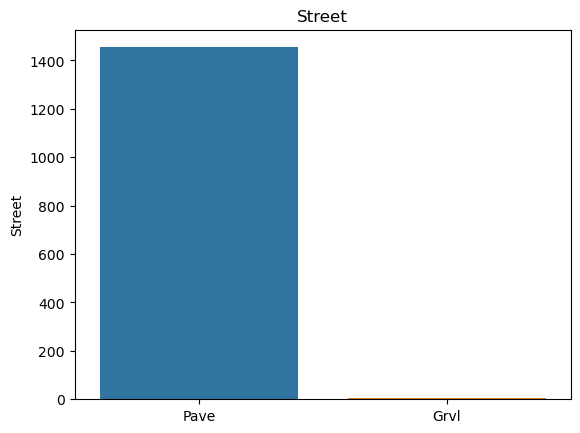

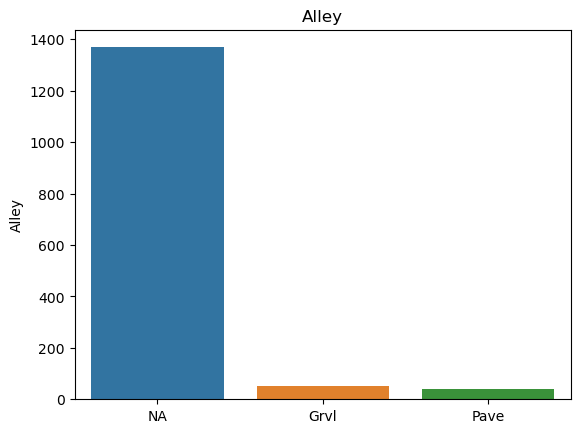

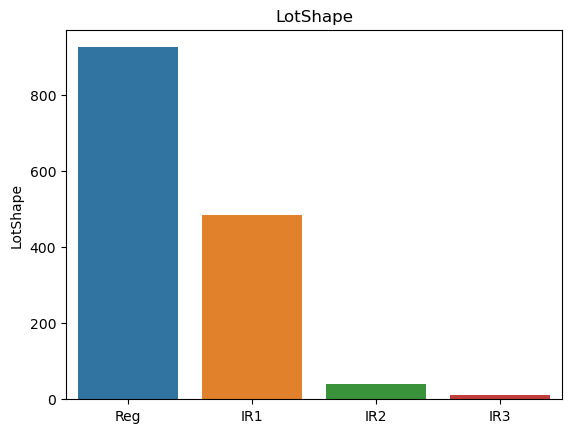

...

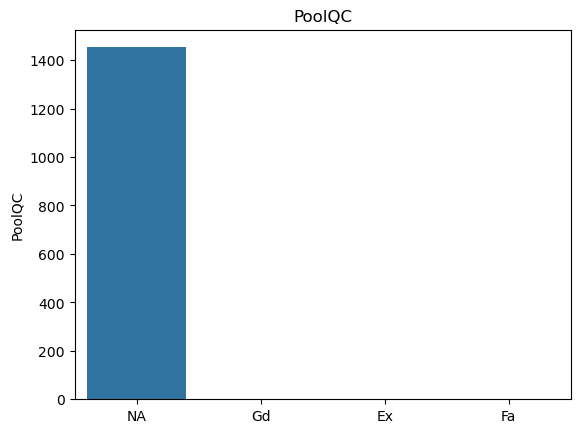

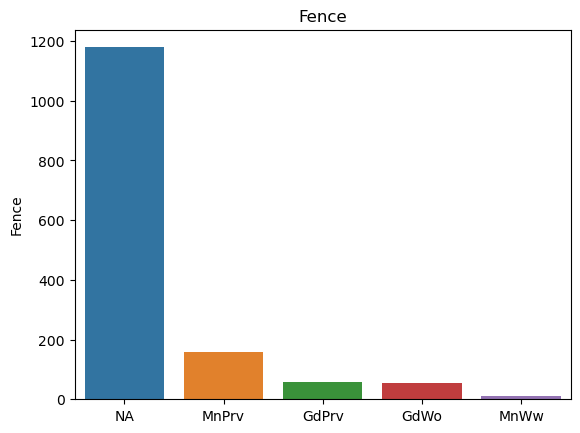

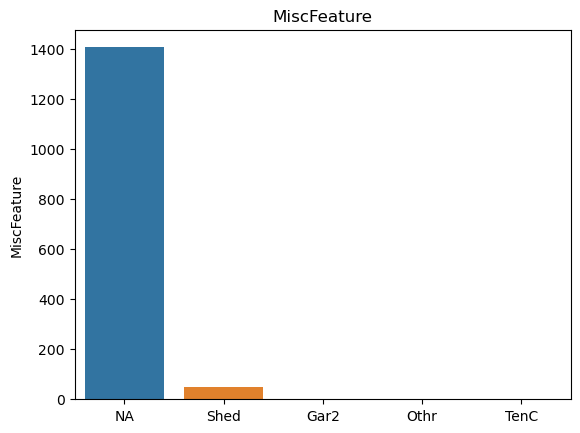

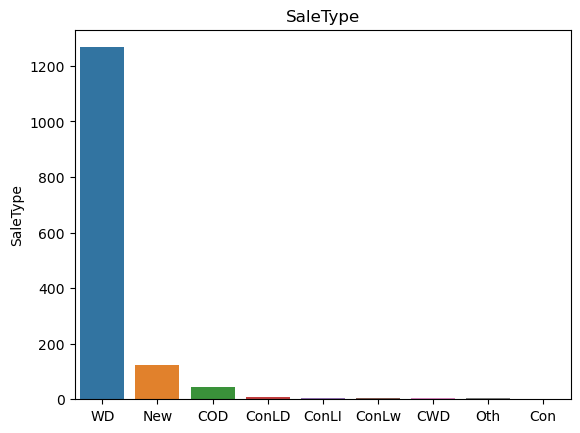

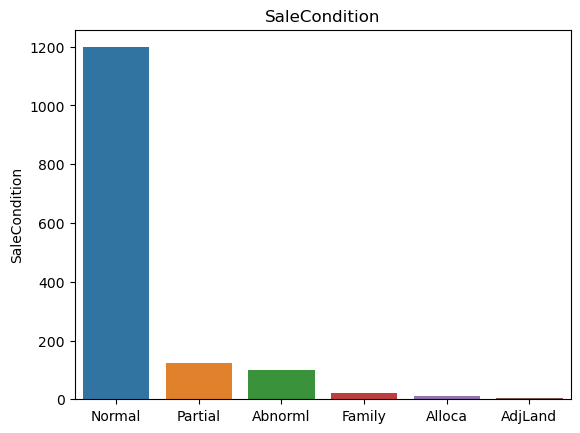

In [18]:
# Visualizing the levels of categorical columns using bar plots
for col in df_categorical.columns:
    plt.title(col, fontdict={'fontsize': 12})
    sns.barplot(df_categorical[col].value_counts().index, df_categorical[col].value_counts())
    plt.show()

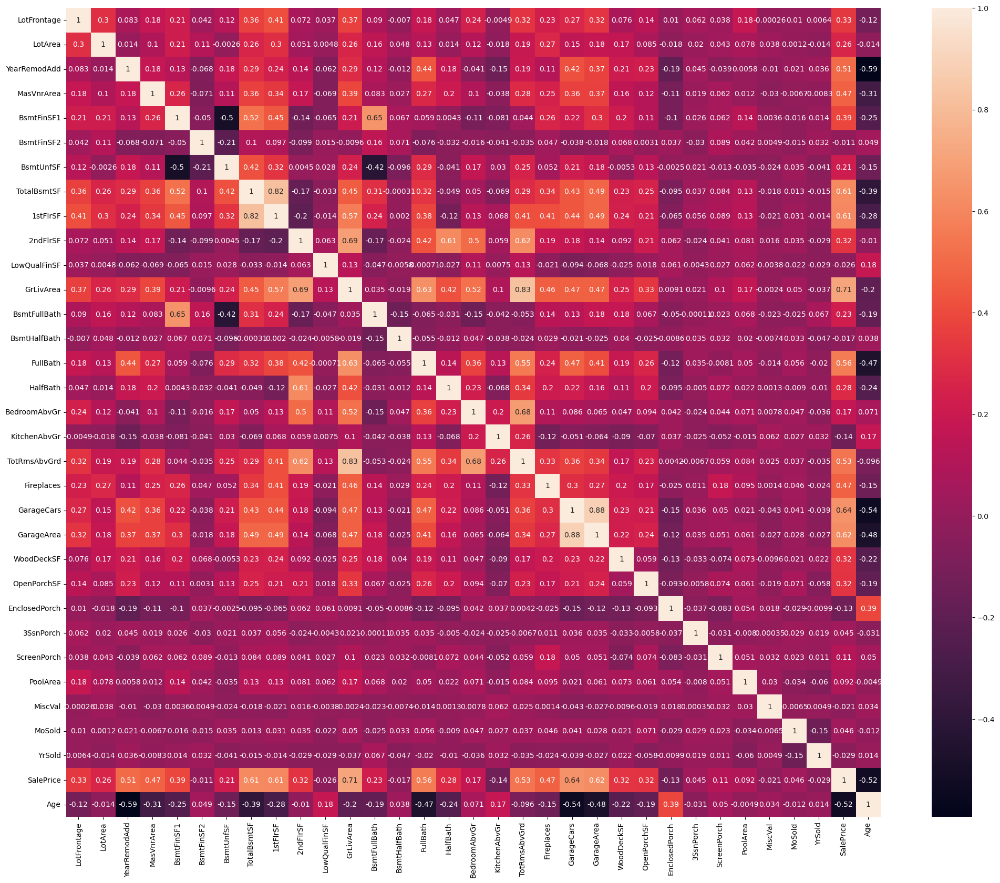

In [19]:
# Checking the correlation
plt.figure(figsize=(25,20))
sns.heatmap(df.corr(), annot=True);

### Observation

- Target variable SalePrice is highly correlated with GrLivArea, GarageCars and GarageArea.

### Dummy variable creation

In [20]:
df_cat_dummies = pd.get_dummies(df_categorical, drop_first=True)
df_cat_dummies.head()

,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_NA,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NA,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_NA,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageYrBlt_1906,GarageYrBlt_1908,GarageYrBlt_1910,GarageYrBlt_1914,GarageYrBlt_1915,GarageYrBlt_1916,GarageYrBlt_1918,GarageYrBlt_1920,GarageYrBlt_1921,GarageYrBlt_1922,GarageYrBlt_1923,GarageYrBlt_1924,GarageYrBlt_1925,GarageYrBlt_1926,GarageYrBlt_1927,GarageYrBlt_1928,GarageYrBlt_1929,GarageYrBlt_1930,GarageYrBlt_1931,GarageYrBlt_1932,GarageYrBlt_1933,GarageYrBlt_1934,GarageYrBlt_1935,GarageYrBlt_1936,GarageYrBlt_1937,GarageYrBlt_1938,GarageYrBlt_1939,Gara

In [21]:
# Concating numerical columns with caegorical dummy variables
df = pd.concat([df_numerical, df_cat_dummies], axis=1)
df.head()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,Age,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_NA,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_NA,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtCond_Gd,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_NA,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_NA,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageYrBlt_1906,GarageYrBlt_1908,GarageYrBlt_1910,GarageYrBlt_1914,GarageYrBlt_1915,GarageYrBlt_1916,GarageYrBlt_

### Splitting the data in train and test set

In [22]:
# Setting target variable and splitting train and test in 70-30 percent
y = df['SalePrice']
X = df.drop('SalePrice',axis=1)


In [23]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

### Scaling

In [24]:
scaler = StandardScaler()

In [25]:
# Scaling the numerical variables
numerical_cols = list(X_train.select_dtypes(include=['int64', 'float64']).columns)
X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])

## Model building

## Ridge Regression

In [26]:
# List of alpha values to find the optimum one
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0,
                    2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]}

ridge = Ridge()

# Cross validation

ridgeCV = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = 5, 
                        return_train_score=True,
                        verbose = 1, n_jobs=-1)            
ridgeCV.fit(X_train, y_train) 


Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [27]:
# Viewing the optimal value of alpha

ridgeCV.best_params_

{'alpha': 10.0}

In [28]:
# Viewing the results of cross validation search

ridgeCV.cv_results_

{'mean_fit_time': array([0.12235823, 0.0644268 , 0.06171284, 0.05481138, 0.12568979,
        0.05567913, 0.05992279, 0.05673671, 0.05865755, 0.21833887,
        0.30307117, 0.15632124, 0.15008063, 0.24298286, 0.2338695 ,
        0.07776175, 0.09208379, 0.04833241, 0.05292573, 0.05193825,
        0.05204024, 0.05241818, 0.04835653, 0.05274754, 0.05895524,
        0.04982553, 0.05062895, 0.04303679]),
 'std_fit_time': array([0.03084389, 0.01543774, 0.00591356, 0.00528028, 0.02797912,
        0.00457853, 0.00284581, 0.00944151, 0.00777963, 0.20046964,
        0.12305369, 0.03010073, 0.07873461, 0.03954975, 0.07542885,
        0.02370939, 0.01793529, 0.00492773, 0.0058308 , 0.00406356,
        0.0055501 , 0.01066346, 0.00525809, 0.01112596, 0.01361814,
        0.0080583 , 0.00543602, 0.00560746]),
 'mean_score_time': array([0.01175284, 0.01627636, 0.01393433, 0.01691999, 0.015801  ,
        0.01520119, 0.01450801, 0.01381021, 0.02027731, 0.02513657,
        0.017979  , 0.02137556, 0.018157

In [29]:
# Since the optimum value was alpha=10 so now we create a ridge regression instance with that
ridge = Ridge(alpha=10)
ridge.fit(X_train, y_train)

Ridge(alpha=10)

In [30]:
# Viewing the coefficients of ridge regression fitted model
ridge.coef_

array([ 1.01496315e+03,  4.12662959e+03,  4.62481117e+03,  1.37115048e+03,
        2.46925114e+03,  7.61789308e+01, -2.78221525e+03,  1.08338865e+04,
        4.79446625e+02,  6.07549283e+03,  0.00000000e+00,  1.86877385e+04,
        1.05852204e+03, -1.06010554e+03,  1.98283962e+02,  2.69831999e+02,
       -9.96756402e+02,  0.00000000e+00, -7.23863942e+02,  1.82160820e+03,
        1.85697969e+03,  5.10781009e+03,  1.88834710e+03,  8.51235603e+02,
        3.46818773e+01,  0.00000000e+00,  2.80795489e+02,  0.00000000e+00,
        0.00000000e+00,  3.04271772e+02, -4.37357074e+02, -7.39381474e+03,
        2.58835461e+02, -1.35347184e+02,  3.23519081e+03,  9.12237187e+02,
        4.72728772e+01,  3.61627192e+03,  3.14554796e+03, -7.57948697e+02,
       -1.05773440e+03, -7.62481035e+03, -2.96040797e+03, -5.55965572e+03,
       -2.99497070e+03, -6.46853229e+03,  4.45537279e+03,  3.32440729e+03,
        3.26191949e+03, -1.40413963e+03, -1.14353845e+03,  6.72177313e+02,
        8.94622642e+02, -

In [31]:
# Making predictions
y_train_pred = ridge.predict(X_train)
y_pred = ridge.predict(X_test)

In [32]:
 # Checking the metreics
print("R-Squared of train data =", '%.5f' % r2_score(y_train, y_train_pred))
print("R-Squared of test data =", '%.5f' % r2_score(y_test, y_pred))
    
rss_train = np.sum(np.square(y_train - y_train_pred))
rss_test = np.sum(np.square(y_test - y_pred))
print("Residual sum of squares of train data =", '%.5f' % rss_train)
print("Residual sum of squares of test data =", '%.5f' % rss_test)
    
    
mse_train = mean_squared_error(y_train, y_train_pred)
mse_test = mean_squared_error(y_test, y_pred)
print("Mean Squared Error of train data =", '%.5f' % mse_train)
print("Mean Squared Error of test data =", '%.5f' % mse_test)
    

rmse_train = mse_train**0.5
rmse_test = mse_test**0.5
print("Root Mean Squared Error for train data =", '%.5f' % rmse_train) 
print("Root Mean Squared Error for test data =", '%.5f' % rmse_test) 

R-Squared of train data = 0.94611
R-Squared of test data = 0.89090
Residual sum of squares of train data = 231406423702.34723
Residual sum of squares of test data = 194118025825.90005
Mean Squared Error of train data = 226646840.06106
Mean Squared Error of test data = 443191839.78516
Root Mean Squared Error for train data = 15054.79459
Root Mean Squared Error for test data = 21052.12198


In [33]:
# dataframe of ridge cross validation result
ridgeCV_results= pd.DataFrame(ridgeCV.cv_results_)
ridgeCV_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.122358,0.030844,0.011753,0.001343,0.0001,{'alpha': 0.0001},-16407.877573,-17711.202971,-20374.816412,-16625.153139,-17461.561974,-17716.122414,1416.700216,26,-8282.079539,-8216.841730,-7856.466463,-8316.236795,-8229.834113,-8180.291728,165.828208
1,0.064427,0.015438,0.016276,0.007805,0.001,{'alpha': 0.001},-16276.089295,-17654.926545,-20340.396646,-16604.457569,-17420.272139,-17659.228439,1433.275762,25,-8285.974404,-8218.095834,-7858.675561,-8316.852139,-8232.362463,-8182.392080,165.754630
2,0.061713,0.005914,0.013934,0.001992,0.01,{'alpha': 0.01},-15885.811702,-17493.989744,-19995.372251,-16435.952531,-17191.950271,-17400.615300,1414.936586,24,-8301.129442,-8226.842833,-7874.343562,-8324.783256,-8249.241134,-8195.268046,164.245798
3,0.054811,0.005280,0.016920,0.006146,0.05,{'alpha': 0.05},-15204.317910,-17151.458858,-19147.205786,-16071.998826,-16632.977255,-16841.591727,1321.236740,23,-8367.919319,-8256.765466,-7949.659528,-8380.035864,-8329.172724,-8256.710580,159.441289
4,0.125690,0.027979,0.015801,0.002703,0.1,{'alpha': 0.1},-14768.773771,-16885.492164,-18616.795736,-15803.944283,-16228.478274,-16460.696845,1278.832794,22,-8452.129222,-8295.982470,-8028.201434,-8450.638451,-8410.832431,-8327.556802,160.132936
5,0.055679,0.004579,0.015201,0.006183,0.2,{'alpha': 0.2},-14287.864477,-16545.502720,-18037.380419,-15467.422328,-15752.141707,-16018.062330,1242.846870,21,-8593.560529,-8363.515891,-8160.807497,-8586.428727,-8553.661628,-8451.594854,167.968594
6,0.059923,0.002846,0.014508,0.003340,0.3,{'alpha': 0.3},-14045.047880,-16327.822555,-17693.373161,-15233.890867,-15456.699627,-15751.366818,1214.069543,20,-8720.634647,-8420.762992,-8274.658468,-8695.725102,-8669.415159,-8556.239274,177.162349
7,0.056737,0.009442,0.013810,0.004717,0.4,{'alpha': 0.4},-13904.251783,-16161.677713,-17422.522954,-15041.936573,-15246.860837,-15555.449972,1178.036699,19,-8824.154318,-8477.171397,-8371.701393,-8787.361612,-8765.004032,-8645.078550,184.186103
8,0.058658,0.007780,0.020277,0.007691,0.5,{'alpha': 0.5},-13785.037845,-16030.601829,-17196.599544,-14899.510186,-15070.154322,-15396.380745,1148.281680,18,-8912.456237,-8529.328852,-8452.598233,-8867.053929,-8851.553110,-8722.598072,191.726849
9,0.218339,0.200470,0.025137,0.010404,0.6,{'alpha': 0.6},-13679.948490,-15915.028394,-17002.299418,-14786.749063,-14916.151186,-15260.035310,1122.802804,16,-8994.475464,-8578.703655,-8522.843982,-8939.230423,-8929.693529,-8792.989411,199.783892


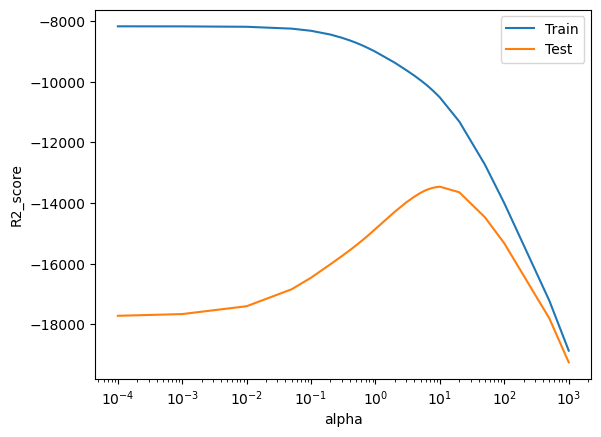

In [34]:
# Plotting R2 score vs alpha values
plt.plot(ridgeCV_results['param_alpha'], ridgeCV_results['mean_train_score'], label='Train')
plt.plot(ridgeCV_results['param_alpha'], ridgeCV_results['mean_test_score'], label='Test')
plt.xlabel('alpha')
plt.ylabel('R2_score')
plt.xscale('log')
plt.legend()
plt.show()


### Observations

- As the value of alpha increases, train error decreases and an initial increase followed by decrease in test error.
- The plot above also confirms that 10 is the optimum value for alpha

## Lasso Regression

In [35]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0,
                    2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]}

lasso = Lasso()

# cross validation
lassoCV = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = 5, 
                        return_train_score=True,
                        verbose = 1, n_jobs=-1)            

lassoCV.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.860e+10, tolerance: 3.374e+08
  model = cd_fast.enet_coordinate_descent(
/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.869e+10, tolerance: 3.435e+08
  model = cd_fast.enet_coordinate_descent(
/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.568e+10, tolerance: 3.477e+08
  model = cd_fast.enet_coordinate_descent(
/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.224e+10, tolerance: 3.435e+08
  model = cd_fast.enet_coordinate_descent(
/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.727e+10, tolerance: 3.466e+08
  model = cd_fast.enet_coordinate_descent(
/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.900e+10, tolerance: 3.477e+08
  model = cd_fast.enet_coordinate_descent(
/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.968e+08, tolerance: 3.466e+08
  model = cd_fast.enet_coordinate_descent(
/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.539e+09, tolerance: 3.477e+08
  model = cd_fast.enet_coordinate_descent(
/Users/prasoonmahawar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consi

GridSearchCV(cv=5, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [36]:
# Viewing the optimal value of alpha
lassoCV.best_params_

{'alpha': 100}

In [37]:
# View the results of cross validation search
lassoCV.cv_results_

{'mean_fit_time': array([1.01331   , 1.20398264, 1.79061718, 1.34475451, 0.9367238 ,
        1.00578938, 0.94823093, 1.09780917, 1.13589902, 1.21974111,
        1.11244855, 1.48973341, 2.03485041, 2.81769652, 2.56004982,
        1.31864252, 0.85477409, 1.28873405, 0.88594718, 0.7658112 ,
        0.83923512, 0.78918672, 0.60345969, 0.58548274, 0.22794175,
        0.15858312, 0.07866087, 0.0519474 ]),
 'std_fit_time': array([0.03581416, 0.36261059, 0.13956381, 0.15819399, 0.08749731,
        0.01316235, 0.02458721, 0.07848467, 0.06675287, 0.05010648,
        0.09780651, 0.34438231, 0.08039439, 0.89246173, 0.75693169,
        0.32989482, 0.3640246 , 0.12192669, 0.38812858, 0.17122512,
        0.26838551, 0.24308901, 0.11878121, 0.3175654 , 0.0570971 ,
        0.0243736 , 0.01581588, 0.00729543]),
 'mean_score_time': array([0.01673303, 0.0236372 , 0.03528919, 0.01239586, 0.01320076,
        0.01309223, 0.01180768, 0.01621003, 0.01259303, 0.02005725,
        0.01733994, 0.03180032, 0.017188

In [38]:
# Creating lasso instance with alpha = 100
lasso = Lasso(alpha=100)
lasso.fit(X_train, y_train)

Lasso(alpha=100)

In [39]:
# viewing coefficients
lasso.coef_

array([ 1.09594361e+03,  4.24303474e+03,  4.67254820e+03,  1.41237490e+03,
        4.24523757e+03,  0.00000000e+00, -7.49817980e+02,  9.79149188e+03,
       -0.00000000e+00,  3.29973858e+03,  0.00000000e+00,  2.02697270e+04,
        1.35940294e+03, -8.19979591e+02,  0.00000000e+00,  7.91653506e+02,
       -1.23098441e+03,  0.00000000e+00, -6.11865924e+02,  2.17870915e+03,
        9.04989656e+02,  4.72175968e+03,  1.95208781e+03,  6.14120966e+02,
        7.59994648e+01,  0.00000000e+00,  2.29296197e+02,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -3.31904542e+02, -8.88680291e+03,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -1.42717981e+04, -0.00000000e+00, -4.09414041e+03,
       -0.00000000e+00, -1.05123089e+04,  0.00000000e+00,  0.00000000e+00,
        1.07820084e+03, -2.50198823e+03, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -

In [40]:
## Maing predictions
y_train_pred_lasso = lasso.predict(X_train)
y_pred_lasso = lasso.predict(X_test)

In [41]:
# Checking the metreics
print("R-Squared of train data =", '%.5f' % r2_score(y_train, y_train_pred_lasso))
print("R-Squared of test data =", '%.5f' % r2_score(y_test, y_pred_lasso))
    
rss_train_lasso = np.sum(np.square(y_train - y_train_pred_lasso))
rss_test_lasso = np.sum(np.square(y_test - y_pred_lasso))
print("Residual sum of squares of train data =", '%.5f' % rss_train_lasso)
print("Residual sum of squares of test data =", '%.5f' % rss_test_lasso)
    
    
mse_train_lasso = mean_squared_error(y_train, y_train_pred_lasso)
mse_test_lasso = mean_squared_error(y_test, y_pred_lasso)
print("Mean Squared Error of train data =", '%.5f' % mse_train_lasso)
print("Mean Squared Error of test data =", '%.5f' % mse_test_lasso)
    

rmse_train_lasso = mse_train**0.5
rmse_test_lasso = mse_test**0.5
print("Root Mean Squared Error for train data =", '%.5f' % rmse_train_lasso) 
print("Root Mean Squared Error for test data =", '%.5f' % rmse_test_lasso)

R-Squared of train data = 0.94034
R-Squared of test data = 0.87933
Residual sum of squares of train data = 256146730710.92096
Residual sum of squares of test data = 214693455160.02866
Mean Squared Error of train data = 250878286.69042
Mean Squared Error of test data = 490167705.84481
Root Mean Squared Error for train data = 15054.79459
Root Mean Squared Error for test data = 21052.12198


In [42]:
# dataframe of lasso cross validation result

lassoCV_results= pd.DataFrame(lassoCV.cv_results_)
lassoCV_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.013310,0.035814,0.016733,0.004626,0.0001,{'alpha': 0.0001},-16104.044833,-17600.851828,-20259.293530,-16529.437212,-17318.391141,-17562.403709,1451.073085,28,-8282.580032,-8218.789545,-7856.623161,-8324.495072,-8231.467491,-8182.791060,167.384976
1,1.203983,0.362611,0.023637,0.018296,0.001,{'alpha': 0.001},-16103.263701,-17599.565065,-20253.419561,-16529.218457,-17317.531050,-17560.599567,1449.100062,27,-8282.597320,-8218.808295,-7856.649377,-8324.482876,-8231.526678,-8182.812909,167.379005
2,1.790617,0.139564,0.035289,0.028516,0.01,{'alpha': 0.01},-16095.327029,-17589.503687,-20194.526178,-16528.139761,-17309.112486,-17543.321828,1429.206413,26,-8282.903998,-8219.101332,-7857.116763,-8324.527765,-8232.192395,-8183.168451,167.292473
3,1.344755,0.158194,0.012396,0.002119,0.05,{'alpha': 0.05},-16059.560081,-17561.080657,-20021.837291,-16525.677905,-17278.461194,-17489.323426,1373.759395,25,-8284.453922,-8220.879258,-7859.355192,-8325.036747,-8234.705803,-8184.886184,166.915450
4,0.936724,0.087497,0.013201,0.002803,0.1,{'alpha': 0.1},-16017.811046,-17536.521346,-19978.018206,-16498.941243,-17241.760492,-17454.610467,1370.933796,24,-8285.912450,-8222.840918,-7862.372914,-8325.948444,-8237.072596,-8186.829464,166.291779
5,1.005789,0.013162,0.013092,0.003016,0.2,{'alpha': 0.2},-15931.481985,-17490.596034,-19895.196831,-16444.056001,-17160.957581,-17384.457687,1368.248692,23,-8288.906960,-8226.423166,-7867.766364,-8327.639669,-8241.548264,-8190.456885,165.254113
6,0.948231,0.024587,0.011808,0.001194,0.3,{'alpha': 0.3},-15852.648228,-17446.327899,-19814.410771,-16399.073266,-17078.091456,-17318.110324,1363.654868,22,-8291.587047,-8230.032154,-7873.078465,-8329.044834,-8246.112322,-8193.970965,164.173674
7,1.097809,0.078485,0.016210,0.005888,0.4,{'alpha': 0.4},-15769.285189,-17404.629667,-19738.627878,-16354.011723,-17002.667195,-17253.844330,1361.880319,21,-8295.533264,-8233.776743,-7878.910377,-8331.811548,-8250.862257,-8198.178838,163.285449
8,1.135899,0.066753,0.012593,0.003451,0.5,{'alpha': 0.5},-15692.161970,-17368.533638,-19659.492368,-16314.918447,-16930.012220,-17193.023728,1356.989406,19,-8298.914066,-8237.216305,-7884.815610,-8335.059895,-8256.828657,-8202.566906,162.448744
9,1.219741,0.050106,0.020057,0.005922,0.6,{'alpha': 0.6},-15628.972022,-17348.606218,-19586.485169,-16279.582174,-16856.256150,-17139.980347,1351.505915,18,-8302.415058,-8239.612049,-7891.178799,-8338.509169,-8263.099638,-8206.962942,161.463577


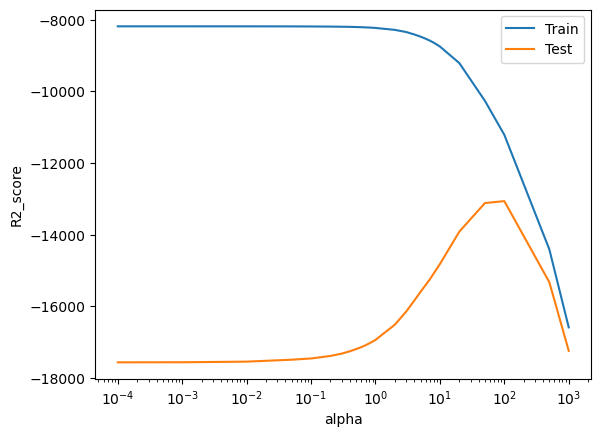

In [43]:
# Plotting R2 score vs alpha values
plt.plot(lassoCV_results['param_alpha'], lassoCV_results['mean_train_score'], label='Train')
plt.plot(lassoCV_results['param_alpha'], lassoCV_results['mean_test_score'], label='Test')
plt.xlabel('alpha')
plt.ylabel('R2_score')
plt.xscale('log')
plt.legend()
plt.show()

### Observations

- As the value of alpha increases, train error decreases and an initial increase followed by decrease in test error.
- The plot above also confirms that 100 is the optimum value for alpha

## Comparing both models

In [44]:
comparison = pd.DataFrame(index=X.columns)
comparison.rows = X.columns
comparison['Ridge'] = ridge.coef_
comparison['Lasso'] = lasso.coef_
comparison

,Ridge,Lasso
LotFrontage,1014.963154,1095.943606
LotArea,4126.629593,4243.034740
YearRemodAdd,4624.811168,4672.548199
MasVnrArea,1371.150481,1412.374905
BsmtFinSF1,2469.251137,4245.237571
BsmtFinSF2,76.178931,0.000000
BsmtUnfSF,-2782.215248,-749.817980
TotalBsmtSF,10833.886496,9791.491880
1stFlrSF,479.446625,-0.000000
2ndFlrSF,6075.492829,3299.738582


In [45]:
# View the top 10 coefficients of Ridge regression in descending order
comparison['Ridge'].sort_values(ascending=False)[:10]

OverallQual_9           23391.128013
GrLivArea               18687.738485
OverallQual_8           16689.095485
OverallCond_9           15797.220706
Neighborhood_Crawfor    14305.568515
Functional_Typ          12328.168219
Exterior1st_BrkFace     11405.526883
TotalBsmtSF             10833.886496
Neighborhood_Somerst     9802.859056
PoolQC_NA                9653.167365
Name: Ridge, dtype: float64

In [46]:
# View the top 10 coefficients of Lasso in descending order
comparison['Lasso'].sort_values(ascending=False)[:10]

OverallQual_9           44267.337275
OverallQual_8           29541.516485
OverallCond_9           26490.963909
GrLivArea               20269.726973
Neighborhood_Crawfor    17858.935415
Exterior1st_BrkFace     16189.774292
Functional_Typ          14267.270090
Neighborhood_Somerst    12820.092693
Neighborhood_NoRidge    11094.355298
BsmtExposure_Gd         10644.924518
Name: Lasso, dtype: float64

### Feature elimination done by lasso

In [47]:
comparison[comparison['Lasso']==0]

,Ridge,Lasso
BsmtFinSF2,76.178931,0.0
1stFlrSF,479.446625,-0.0
LowQualFinSF,0.000000,0.0
FullBath,198.283962,0.0
KitchenAbvGr,0.000000,0.0
3SsnPorch,0.000000,0.0
PoolArea,0.000000,0.0
MiscVal,0.000000,0.0
MoSold,304.271772,0.0
MSSubClass_30,258.835461,0.0


### Final Outcomes and inferences

- Optimal value of lambda for Ridge Regression = 10
- Optimal value of lambda for Lasso Regression = 100
- The variables significant in predicting the price of a house are :- 
      - GrLivArea
      - OverallQual_9
      - OverallCond_9 
      - OverallQual_8 
      - Neighborhood_Crawfor 
      - Functional_Typ 
      - Exterior1st_BrkFace 
      - SaleCondition_Alloca 
      - CentralAir_Y 
      - TotalBsmtSF 
      - Neighborhood_Somerst
      - TotalBsmtSF 
      - Condition1_Norm
 - Lasso performs feature elimination